### Install dependency

In [35]:
!apt-get install imagemagick

Reading package lists... Done
Building dependency tree       
Reading state information... Done
imagemagick is already the newest version (8:6.9.7.4+dfsg-16ubuntu6.8).
0 upgraded, 0 newly installed, 0 to remove and 32 not upgraded.


In [0]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

import matplotlib.pyplot as plt
import numpy as np
from matplotlib import animation, rc
import matplotlib.pyplot as plt
%matplotlib inline

# Linear regression with one variable
#### Predicting hardware requirements for automatic analysis


We will use a hypothetical scenario which Threat Analysis team can face when signing up a new customer to protect. 
If we know on average the volume of the samples per hour from existing customers and how much CPU core the customers use to process these samples, can we predict how many CPU cores we need to use for a new customer to perform automatic sample analysis?

### Generate data for exercise

Since customer data is private, we would use generated data in given range.
Dataset will consist of 100 customers who observed from 500 to 20000 samples an hour.

In [37]:
import numpy as np

pool = np.random.RandomState(10)
X = pool.rand(100, 1)
X = 500 + X * 20000 // 1
X.shape

(100, 1)

Then we will add some randomness in the dataset, to make sure we don't have all points on one line. To generate dataset, we will make an assumption that on average it takes 100 seconds for automatic anaysis system to analyse one random sample.

NOTE: this is a very simplified dataset for demonstration purposes only. In real scenario you can face much more comples ones, and you obviously don't need to come up with your own.

In [0]:
rd = pool.rand(X.shape[0], X.shape[1])
rd = rd*0.7+0.7
y=[]
for m in range(X.shape[0]):
    y.append((X[m][0]*100*rd[m][0])/3600)

In [0]:
y=np.asarray(y)

In [40]:
y = y // 48 + 1
y = y[:, np.newaxis]
y.shape

(100, 1)

### Create Pandas DataFrame

Before performing any trainig, it is always good to look and analyze data first, for that it is very often useful to create pandas DataFrame. 

You can learn more about it [here](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.html).

In [0]:
import pandas as pd

df=pd.DataFrame({'x: Samples (per hour)': X[:,0].astype(int), 'y: CPU cores required': y[:,0].astype(int)})

It allows quickly check out first few elements, to see overall format, in case you data was loaded from CSV file for example.

In [42]:
df.head()

,x: Samples (per hour),y: CPU cores required
0,15926,11
1,915,1
2,13172,6
3,15476,10
4,10470,8


As you can see in our dataset:

*   $x$ is a number of samples observed by a customer per hour. 

*   $y$ is a number of CPU cores the customer uses to process data.

### Plot dataset

It is always convenient to visualize data as well to see if it is possible. In our case, we only work with one vaiable, so we can easily plot dataset 2D.

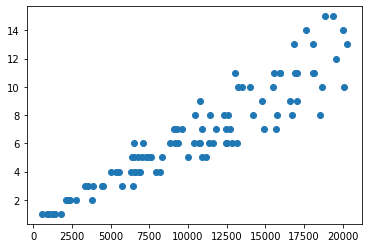

In [43]:
plt.scatter(X, y)

### Model representation

The goal of most machine learning algorithms is to construct a model:
a hypothesis that can be used to estimate $Y$ based on $X$. The hypothesis, or model, maps *inputs* to *outputs*.

For example, in our case we would like to predict how many CPUs a new customer needs to process 16400 samples an hour.

Since we will use Linear Regression with one variable, our hypothesis will look like:

$h_{\theta }\left( x\right)  \  =\  \theta_{0} \  +\  \theta_{1} x$


$h_{\theta }\left( x\right)$ predicts a number of required CPU cores to perform analysis in about an hour. 

$\theta_{0}$ and $\theta_{1}$ are parametes of the model.

Let's visualize some basic examples to see how $\theta_{0}$ and $\theta_{1}$  affects $h_{\theta }\left( x\right)$

####  Visualize how hypothesis depends on parameters

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


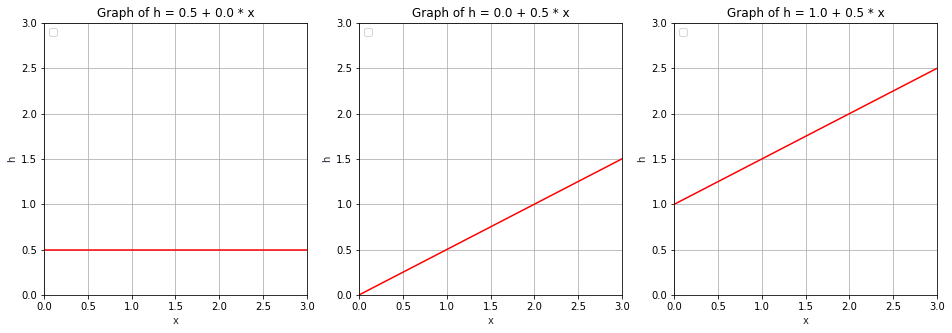

In [44]:
def plot_h(x, h, theta0, theta1):
    plt.title('Graph of h = {} + {} * x'.format(theta0, theta1))
    plt.xlabel('x', color='#1C2833')
    plt.ylabel('h', color='#1C2833')
    plt.xlim([0,3])
    plt.ylim([0,3])
    plt.legend(loc='upper left')
    plt.grid()
    plt.plot(x, h, '-r',)

x = np.linspace(0,3,10)
x= x.reshape(10, 1)
theta0 = np.asarray([[0.5], [0.0], [1.0]])
theta1 = np.asarray([[0.0], [0.5], [0.5]])

h = theta0 + theta1*x.T

fig = plt.figure(figsize=(16,5))
fig.add_subplot(131); plot_h(x, h[0], theta0[0][0], theta1[0][0])
fig.add_subplot(132); plot_h(x, h[1], theta0[1][0], theta1[1][0])
fig.add_subplot(133); plot_h(x, h[2], theta0[2][0], theta1[2][0])

### Cost function

We need to choose parameters $\theta_{0}$ and $\theta_{1}$ to make $h_{\theta }\left( x\right)$ as close as possible to $y$ for our training examples $\left( x^{\left( i\right)  },\  y^{\left( i\right)  }\right)$.

To formalize our goal, we need to find $\theta_{0}$ and $\theta_{1}$ to minimize cost function. There are actually a few different cost functions which can be used, but most common one for Logistic Regression is **Mean Squared Error (MSE)** function:

$J(\theta_{0} ,\theta_{1} )\  =\  \frac{1}{2m} \sum^{m}_{i=1} \left( h_{\theta }\left( x^{(i)}\right)  \  -\  y^{\left( i\right)  }\right)^{2}  $



In [0]:
# The cost function J (MSE)
def cost_function(theta0, theta1, x, y, m):
    J = 0
    for i in range(m):
        J += ((theta0 + theta1*x[i]) - y[i] )**2
    return 1/(2*m) * J

The question is how can we chose the most optimal parameters to get minimized J ?

Let's simplify the task for now by setting $\theta_{0}$ to 0.
This way we only need to find right $\theta_{1}$ and our hypothesis is simplified to 
$h_{\theta }(x) = \theta_{1}$

We can start from picking random values and compute both cost function as well as hypothesis.

In [46]:
fig = plt.figure(figsize=(12,5))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
plt.close()

ax1.set_xlabel("theta1")
ax1.set_ylabel("cost function (J)")
ax1.set_xlim((-0.007,0.007))
ax1.set_ylim((0,2500))

ax2.set_xlabel("Samples (per hour)")
ax2.set_ylabel("CPU cores required")

ax2.set_xlim((0,22000))
ax2.set_ylim((-10,20))
ax2.plot(X, y, "b.")

theta0 = 0.0
theta1 = np.linspace(-0.007,0.007,1000)
theta1_points = np.asarray([[0.006], [-0.001], [0.001], [-0.002], [0.003], [0.0015]])

def animate(i):
    if i == len(theta1_points):
        ax1.plot(theta1, cost_function(theta0, theta1,X,y,m=len(X)))
    else:
        ax1.plot(theta1_points[i], cost_function(theta0, theta1_points[i],X,y,m=len(X)), "ro", markersize=6)
        ax2.plot(X, theta0 + X.dot(theta1_points[i]), "r-", linewidth=0.1)


anim = animation.FuncAnimation(fig, animate, interval=1500, frames=len(theta1_points)+1) 

 # set a0 to 0.1
# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim
#anim.save('gd_linear_regression.gif', dpi=80, writer='imagemagick')


After ploting enough points, you might notice that $J(\theta_{1})$ is a parabola like function. It is important to note that this function is a [convex function](https://en.wikipedia.org/wiki/Convex_function), so it is "bowl-shaped" and doesn't have any local optima, except global one. 

So the question is how can we find this global optima? We need to pick $\theta_{1}$ randomly and then iteratively change it into "right direction" until we reach the minimum. That is exactly what gradient descent does.

### Gradient descent

According to [Wiki](https://en.wikipedia.org/wiki/Gradient_descent):

*"Gradient descent is a first-order iterative optimization algorithm for finding a local minimum of a differentiable function. To find a local minimum of a function using gradient descent, we take steps proportional to the negative of the gradient (or approximate gradient) of the function at the current point. But if we instead take steps proportional to the positive of the gradient, we approach a local maximum of that function; the procedure is then known as gradient ascent."*

Formal definition of an update step of gradient descent looks like:

$\theta_{j}:\  \theta_{j} \  -\  \alpha \frac{\partial }{\partial \theta_{j} } J\left( \theta_{0} ,\  \theta_{1} \right)$ for $j=0$ and $j=1$ 

where $\alpha$ is the learning rate, or how quickly we want to move towards the minimum.

$\frac{\partial }{\partial \theta_{j}}$ is the partial derivate of the the cost function.

for $j = 0$, $\frac{\partial }{\partial \theta_{0} } J\left( \theta_{0} ,\  \theta_{1} \right)  \  =\  \frac{1}{m} \sum^{m}_{i=1} \left( h_{\theta }\left( x^{\left( i\right)  }\right)  \  -\  y^{\left( i\right)  }\right)$

for $j = 1$, $\frac{\partial }{\partial \theta_{1} } J\left( \theta_{0} ,\  \theta_{1} \right)  \  =\  \frac{1}{m} \sum^{m}_{i=1} \left( h_{\theta }\left( x^{\left( i\right)  }\right)  \  -\  y^{\left( i\right)  }\right)  \  \cdot \  x^{\left( i\right)  }$

Which gives us an update step for Gradient Descent in Linear Regression:

$ repeat\ until\ convergence\ \{$

$\ \ \ \theta_{0}:\  \theta_{0} \  -\  \alpha \frac{1}{m} \sum^{m}_{i=1} \left( h_{\theta }\left( x^{\left( i\right)  }\right)  \  -\  y^{\left( i\right)  }\right) $

$\ \ \ \theta_{1}:\  \theta_{1} \  -\  \alpha \frac{1}{m} \sum^{m}_{i=1} \left( h_{\theta }\left( x^{\left( i\right)  }\right)  \  -\  y^{\left( i\right)  }\right)  \  \cdot \  x^{\left( i\right)  }$

$  \}$

NOTE: The update step needs to be performed for all $\theta_{j}$ simultaneously. 

Another important thing to look at is a hyperparameter $\alpha $ (learning rate). The learning rate definis how fast parameters $\theta_{0}$ and $\theta_{1}$ will be updated.

Let's pick a learning rate equal 0.000000001 and visualize how cost function $J$ converges for $\theta_{0} = 0$ and $\theta_{1}$ updated by gradient descent.

Some of the code was taken from [here](https://github.com/ageron/handson-ml2/blob/master/04_training_linear_models.ipynb)

In [0]:
def visualize_gradient_2d(theta0, theta1, X, y, lr):
    fig = plt.figure(figsize=(12,5))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    plt.close()

    ax1.set_xlabel("theta1")
    ax1.set_ylabel("cost function (J)")
    ax1.set_xlim((-0.007,0.007))
    ax1.set_ylim((0,2500))

    ax2.set_xlabel("Samples (per hour)")
    ax2.set_ylabel("CPU cores required")

    ax2.set_xlim((0,22000))
    ax2.set_ylim((-10,20))
    ax2.plot(X, y, "b.")

    theta1_grid = np.linspace(-0.007,0.007,1000)

    ax1.plot(theta1_grid, cost_function(theta0, theta1_grid, X, y, m=len(X)))

    def animate(i):
        global theta0
        global theta1

        ax1.plot(theta1, cost_function(theta0, theta1, X, y, m=len(X)), "ro", markersize=6)
        ax2.plot(X, theta0 + X.dot(theta1), "r-", linewidth=0.1)

        gradients = 2/m * X.T.dot(X.dot(theta1) - y)
        theta1 = theta1 - lr * gradients

    anim = animation.FuncAnimation(fig, animate, interval=500, frames=20) 
    return anim

In [48]:
theta0 = 0
theta1 = 0.008
anim = visualize_gradient_2d(theta0, theta1, X, y, 0.000000001)
# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim
#anim.save('gd_linear_regression.gif', dpi=80, writer='imagemagick')

Perfect, it looks like we got lucky and picked a correct learning rate.
But what if we had picked a learning rate equal 000000007 instead?

In [49]:
theta0 = 0
theta1 = 0.004
anim = visualize_gradient_2d(theta0, theta1, X, y, 0.0000000075)
# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim
#anim.save('gd_linear_regression.gif', dpi=80, writer='imagemagick')

You can see that the results of cost function J is moving to a "wrong" direction. It is increasing instaed of decreasing. The reason is because learning rate is too large and jumps "over" the correct minimum of J.

What would happen if the learning rate is too small? Let's see 

In [50]:
theta0 = 0
theta1 = 0.006
anim = visualize_gradient_2d(theta0, theta1, X, y, 0.00000000005)
# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim
#anim.save('gd_linear_regression.gif', dpi=80, writer='imagemagick')

You can see that the value J is moving torwards the optima, however too slow, and the training might take too long, or even never converge if the learning rate is too small. 

Now you know why the learning rate is very important hyperparameter is a high impact to your training results.

If we don't update $\theta_{0}$, then the cost function J only depends on $\theta_{1}$ and we can plot results of the updates as 2D graph. But what if we update both paratemeters $\theta$? 

Then the graph becomes 3D, let's plot is and update both values using gradient descent.

To make our functions more efficient, let's vectorice both $h(x)$ and $J(\theta_{0} ,\theta_{1} )$

First we need to add an extra column with bias parameter to X. It will be used to multiply on $\theta_{0}$ during matrix multiplication.

In [51]:
X_b = np.c_[np.ones((100, 1)), X]  # add x0 = 1 to each instance

print("X.shape: {}".format(X_b.shape))
print("X: {}".format(X_b[:5]))

X.shape: (100, 2)
X: [[1.0000e+00 1.5926e+04]
 [1.0000e+00 9.1500e+02]
 [1.0000e+00 1.3172e+04]
 [1.0000e+00 1.5476e+04]
 [1.0000e+00 1.0470e+04]]


In [0]:
# hypothesis function vectorized
def h_vec(thetas, X):
    return X.dot(thetas)

# The cost function J (MSE)
def cost_function_vec(thetas, X, y):
    return 1/(2*X.shape[0]) * np.sum((h_vec(thetas, X) - y)**2, axis=0, keepdims=True)

Then modify our update function to update both all parameters:

In [0]:
def update_parameters(thetas, X, y, lr):
    gradients = 2/m * X.T.dot(X.dot(thetas) - y)
    thetas = thetas - lr * gradients
    return thetas

In [0]:
def genetate_cost_log(thetas, X, y, lr, num_iters):
    J_log = []
    theta0_log = []
    theta1_log = []

    for i in range(num_iters):
        J = cost_function_vec(thetas, X, y)[0]
        J_log.append(J)
        theta0_log.append(thetas[0])
        theta1_log.append(thetas[1])
        thetas = update_parameters(thetas, X, y, lr)
    return np.asarray([theta0_log, theta1_log, J_log])

In [0]:
def visualize_gradient(J_log, X, y, is_contour=False, theta0_range=None, theta1_range=None):
    fig = plt.figure(figsize=(12,6))
    if is_contour:
        ax1 = fig.add_subplot(111)
    else:
        ax1 = fig.add_subplot(111,projection='3d')
    plt.close()

    ax1.set_xlabel("theta0")
    ax1.set_ylabel("theta1")

    if theta0_range is None:
        theta0_range = np.linspace(-50,50, 1000)
    if theta1_range is None:
        theta1_range = np.linspace(-0.007,0.007,1000)

    theta_grid0, theta_grid1 = np.asarray(np.meshgrid(theta0_range, theta1_range))
    thetas_grid = np.asarray([theta_grid0, theta_grid1]).reshape(2,1000000)

    if is_contour:       
        J_max = np.max(J_log[2])* 1.5
        contour_step = J_max / 30
        ax1.contour(theta_grid0,theta_grid1, cost_function_vec(thetas_grid,X,y).reshape(1000, 1000),
                colors='C0', levels=[i for i in np.arange(0,J_max,contour_step)])
    else:
        ax1.plot_surface(theta_grid0, theta_grid1, cost_function_vec(thetas_grid, X, y).reshape(1000, 1000), 
                         alpha=0.3, linewidth=0.1)
    def animate(i):
        if is_contour:
            ax1.plot(J_log[0][i], J_log[1][i], "ro", markersize=6)
        else:
            ax1.plot(J_log[0][i], J_log[1][i], J_log[2][i], "ro", markersize=6)

    anim = animation.FuncAnimation(fig, animate, interval=500, frames=J_log.shape[1]) 
    return anim

In [56]:
thetas = np.asarray([[40], [0.007]])

J_log = genetate_cost_log(thetas, X_b, y, 0.000000001, 20)
anim = visualize_gradient(J_log, X_b, y, False)
# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim
#anim.save('gd_linear_regression.gif', dpi=80, writer='imagemagick')

Something seems to be wrong. The cost adjustment happens only by axis theta1, but theta0 stay almost unchanged. Let's look at the coutur 

In [57]:
thetas = np.asarray([[40], [0.007]])
J_log = genetate_cost_log(thetas, X_b, y, 0.000000001, 20)
anim = visualize_gradient(J_log, X_b, y, True)
# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim
#anim.save('gd_linear_regression.gif', dpi=80, writer='imagemagick')

Indeed, instead of going the the optima, only theta0 gets updated and gradient descent gets stuck on the countur still far away from the optima.

What is going on?

### Feature scaling

The issue is indeed that the learning rate $\alpha$ which we apply to $\theta_{0}$ and $\theta_{1}$ at the parameters update step is the same for both.

Looking at the dataset, you should have noticed that $x1$ is in the range of pretty large numbers while $y$ is much smaller. As a result, we have a situation where $\theta_{1}$ optimal value is very small while $\theta_{0}$ is not.

If we keep the learning rate $\alpha$ as is, then it is so small, that it only affects $\theta_{1}$, while $\theta_{0}$ is changing very very slow.

If we set the learning rate $\alpha$ to a larger value, then $\theta_{0}$ will be chaning faster, but $\theta_{1}$ will start jump over optimal value, and cost will not reduce (acctually might even increase). 

The solution to the problem is feature scaling. 
Feature scaling is a method used to normalize the range of independent variables or features of data. 

You can find more details about different ways to scale data [here](https://en.wikipedia.org/wiki/Feature_scaling)
In our case, we simply want $x1$ to be in the range from 0 to 1, so both $\theta_{0}$ and $\theta_{1}$ are updated correctly using the same learning rate.

In [0]:
x_max = np.max(X)
x_min = np.min(X)
X_norm = (X-x_min) / (x_max-x_min)

X_norm_b = np.c_[np.ones((100, 1)), X_norm]  # add x0 = 1 to each instance

In [59]:
thetas = np.asarray([[5], [14]])
theta0_range = np.linspace(-1,6, 1000)
theta1_range = np.linspace(4,16, 1000)
J_log = genetate_cost_log(thetas, X_norm_b, y, 0.1, 20)
anim = visualize_gradient(J_log, X_norm_b, y, False, theta0_range, theta1_range)
# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim
#anim.save('gd_linear_regression.gif', dpi=80, writer='imagemagick')

In [60]:
thetas = np.asarray([[5], [14]])
theta0_range = np.linspace(-1,6, 1000)
theta1_range = np.linspace(4,16, 1000)
J_log = genetate_cost_log(thetas, X_norm_b, y, 0.1, 20)
anim = visualize_gradient(J_log, X_norm_b, y, True, theta0_range, theta1_range)
# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim
#anim.save('gd_linear_regression.gif', dpi=80, writer='imagemagick')

Ok, that looks much better. Let's try to predict how many CPU cores we need to process 16400 samples per hours

In [61]:
thetas = np.asarray([J_log[0][-1], J_log[1][-1]])
samples_num = 16400
X_test=[samples_num]
X_test_norm = (X_test-x_min) / (x_max-x_min)
X_test_norm_b = np.c_[np.ones((X_test_norm.shape[0], 1)), X_test_norm]  # add x0 = 1 to each instance

cpu_core_num = np.ceil(h_vec(thetas, X_test_norm_b))[0][0].astype(int)
print("To process {} samples per hour, you need {} CPU cores".format(samples_num, cpu_core_num))
print("Model parameters:\n  theta0 = {}\n  theta1 = {}\n  X max: {} \n  X min: {}".format(
    J_log[0][-1][0], J_log[1][-1][0], x_max, x_min))

To process 16400 samples per hour, you need 11 CPU cores
Model parameters:
  theta0 = 0.7186792574241211
  theta1 = 11.750605052661516
  X max: 20252.0 
  X min: 578.0


NOTE: X max and X min are parameters of your model as well now (or better to say they are parameters of the feature scaler you use for the model). You should always use X max and X min from the training step while predicting.

### Linear Regression with sklearn

That was a lot of code to implement a very simple model. Do you really need to write it all yourself? The answer is no.

You can use existing libraries such as sklearn or tensorflow to quickly build the model. 

Here is an example of our model implemented using sklearn:

In [0]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X)

X_norm = scaler.transform(X)

model = LinearRegression()
model.fit(X_norm,y)
lspace = np.linspace(0, 20100)
X_regr = lspace[:, np.newaxis]
X_regr_norm = scaler.transform(X_regr)
y_regr = model.predict(X_regr_norm)

Easy, right?

Let's look at model parameters to make sure the ones we got before are correct:

In [90]:
print("Model parameters:\n  theta0 = {}\n  theta1 = {}\n  X max: {} \n  X min: {}".format(
    model.intercept_[0], model.coef_[0][0], scaler.data_max_[0], scaler.data_min_[0]))

Model parameters:
  theta0 = 0.7247875006296729
  theta1 = 11.698426405947764
  X max: 20252.0 
  X min: 578.0


Looks very similar to our parametersm, right?

We can also plot normilized values as well as our hypothesis:

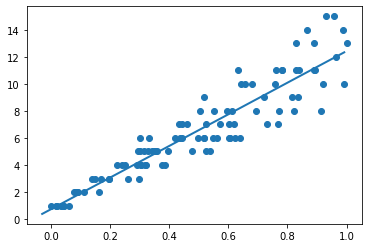

In [88]:
plt.scatter(X_norm, y)
plt.plot(X_regr_norm, y_regr, linewidth=2)

So, how many CPU cores do we need to process 16400 samples per hour?

In [0]:
samples_num = 16400
X_test=[[samples_num]]
X_test_norm = scaler.transform(X_test)
y_test = model.predict(X_test_norm)
cpu_core_num = np.ceil(y_test)[0][0].astype(int)

In [96]:
print("To process {} samples per hour, you need {} CPU cores".format(samples_num, cpu_core_num))

To process 16400 samples per hour, you need 11 CPU cores
